<a href="https://colab.research.google.com/github/k2ola/blur_image/blob/main/Blur_Image_using_YoloV7_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import numpy
import matplotlib.pyplot as plt

In [ ]:
print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 1.12.1+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
!git clone https://github.com/RizwanMunawar/yolov7-segmentation.git

Cloning into 'yolov7-segmentation'...
remote: Enumerating objects: 361, done.
remote: Counting objects: 100% (231/231), done.
remote: Compressing objects: 100% (185/185), done.
remote: Total 361 (delta 118), reused 115 (delta 45), pack-reused 130
Receiving objects: 100% (361/361), 4.97 MiB | 2.60 MiB/s, done.
Resolving deltas: 100% (172/172), done.


In [ ]:
!pip install -U -r yolov7-segmentation/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached protobuf-3.20.3-cp37-cp37m-manylinux_2_5_x86_64.manylinux1_x86_64.whl (1.0 MB)


In [ ]:
pip install google.colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 775 kB 6.5 MB/s 
  Attempting uninstall: ipython
    Found existing installation: ipython 7.34.0
    Uninstalling ipython-7.34.0:
      Successfully uninstalled ipython-7.34.0


In [ ]:
!ls

sample_data  yolov7-segmentation


In [ ]:
pip install --upgrade IPython==7.9.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached ipython-7.9.0-py3-none-any.whl (775 kB)
  Attempting uninstall: IPython
    Found existing installation: ipython 7.34.0
    Uninstalling ipython-7.34.0:
      Successfully uninstalled ipython-7.34.0


In [ ]:
!wget https://cloud.enterprise.deepsystems.io/s/TK2z5TLYoAPl1w6/download

--2022-10-06 19:41:59--  https://cloud.enterprise.deepsystems.io/s/TK2z5TLYoAPl1w6/download
Resolving cloud.enterprise.deepsystems.io (cloud.enterprise.deepsystems.io)... 168.119.137.55
Connecting to cloud.enterprise.deepsystems.io (cloud.enterprise.deepsystems.io)|168.119.137.55|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7876085760 (7.3G) [application/x-tar]
Saving to: ‘download’

download            100%[===================>]   7.33G  19.8MB/s    in 6m 27s  

2022-10-06 19:48:27 (19.4 MB/s) - ‘download’ saved [7876085760/7876085760]



In [ ]:
!tar -xvf download

Streaming output truncated to the last 5000 lines.
Supervisely Person Dataset/ds6/img/hanging-out-trainer-young-79990_fk4fhyJJPf.jpeg
Supervisely Person Dataset/ds6/img/peasant-farmer-farmer-romania-botiza-47862.jpeg
Supervisely Person Dataset/ds6/img/graffiti-artist-graffiti-art-culture-163791.jpeg
Supervisely Person Dataset/ds6/img/smile-portrait-beauty-girl-99568_yANUQ0VbAI.jpeg
Supervisely Person Dataset/ds6/img/woman-mariah-carey-singer-entertainer-65702.jpeg
Supervisely Person Dataset/ds6/img/workout-fitness-street-workout-trees-810900.jpeg
Supervisely Person Dataset/ds6/img/workout-fitness-street-workout-trees-819691.jpeg
Supervisely Person Dataset/ds6/img/football-american-football-sport-ball-163309.jpeg
Supervisely Person Dataset/ds6/img/girl-bicycle-garden-people-630770_Pe9HiefwJ4.jpeg
Supervisely Person Dataset/ds6/img/girls-portrait-sexual-excitement-model-45169.jpeg
Supervisely Person Dataset/ds6/img/purple-dress-oriental-euroasian-asian-157739.jpeg
Supervisely Person Data

In [ ]:
!ls -la

total 7691520
drwxr-xr-x  1 root root       4096 Oct  6 19:48  .
drwxr-xr-x  1 root root       4096 Oct  6 19:38  ..
drwxr-xr-x  4 root root       4096 Oct  5 13:34  .config
-rw-r--r--  1 root root 7876085760 Oct  6 19:48  download
drwxr-xr-x  1 root root       4096 Oct  5 13:35  sample_data
drwxr-xr-x 15 root root       4096 Sep 11  2020 'Supervisely Person Dataset'
drwxr-xr-x  8 root root       4096 Oct  6 19:40  yolov7-segmentation


In [ ]:
!rm download

# Сonvert the dataset in the "Supervisely Person Dataset" directory to the required format for yolov7-segmentation

In [ ]:
import argparse
import glob
import json
import os
import shutil

import numpy as np
from tqdm import tqdm
import random
from sklearn.model_selection import train_test_split

In [ ]:
input_path = "/content/Supervisely Person Dataset/"
output_path = "/content/filt_ds/"

In [ ]:
def create_yolo_file_structure(yolo_path):
    os.makedirs(os.path.dirname(yolo_path + '//ann//'), exist_ok=True)
    os.makedirs(os.path.dirname(yolo_path + '//img//'), exist_ok=True)

In [ ]:
create_yolo_file_structure(output_path)

In [ ]:
dataset_folders = [folder for folder in os.listdir(input_path)]
dataset_folders

['ds12',
 'ds13',
 'ds5',
 'ds8',
 'ds11',
 'ds1',
 'ds3',
 'meta.json',
 'ds9',
 'ds4',
 'ds2',
 'ds7',
 'ds10',
 'ds6']

In [ ]:
for folder in dataset_folders:
    ann_paths = sorted(glob.glob(input_path  + folder + "/ann/" + '*.json'))
    img_paths = sorted(glob.glob(input_path  + folder + "/img/" + '*'))
    
    for (ann_path, img_path) in tqdm(zip(ann_paths, img_paths), desc='Annotations'):
        with open(ann_path) as ann_f:
            ann_data = json.load(ann_f)
            objects = ann_data["objects"]
            
            result = []
            for obj in objects:
                t = obj['classTitle']
                result.append(t)
                
            if 'person_bmp' in result: 
                print(None)
            else:
                shutil.copy(img_path, output_path + 'img/')
                shutil.copy(ann_path, output_path + 'ann/')

Annotations: 13it [00:00, 127.39it/s]

None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 33it [00:00, 140.16it/s]


None


Annotations: 33it [00:00, 570.54it/s]


None
None
None
None
None


Annotations: 135it [00:00, 311.81it/s]
Annotations: 65it [00:00, 645.44it/s]

None
None
None
None
None
None
None
None
None
None


Annotations: 294it [00:01, 217.16it/s]

None
None
None
None
None


Annotations: 375it [00:01, 225.36it/s]

None
None


Annotations: 428it [00:01, 228.21it/s]

None
None


Annotations: 508it [00:02, 233.14it/s]

None
None
None
None
None
None
None
None
None


Annotations: 556it [00:02, 234.08it/s]

None
None
None
None


Annotations: 604it [00:02, 223.54it/s]

None
None
None


Annotations: 630it [00:02, 232.58it/s]

None


Annotations: 683it [00:02, 219.25it/s]

None
None


Annotations: 760it [00:03, 237.56it/s]

None
None
None
None
None


Annotations: 785it [00:03, 227.05it/s]

None
None
None
None
None
None

Annotations: 838it [00:03, 237.44it/s]


None
None
None
None


Annotations: 913it [00:03, 234.65it/s]

None
None
None
None
None


Annotations: 961it [00:04, 235.96it/s]

None
None
None
None
None


Annotations: 985it [00:04, 221.02it/s]

None


Annotations: 1060it [00:04, 233.68it/s]

None
None
None
None
None


Annotations: 1254it [00:05, 190.99it/s]

None
None
None
None


Annotations: 1325it [00:05, 209.05it/s]

None
None
None
None
None
None


Annotations: 1377it [00:06, 228.28it/s]

None
None
None
None
None
None
None
None


Annotations: 1407it [00:06, 223.02it/s]
Annotations: 28it [00:00, 107.90it/s]

None
None
None


Annotations: 98it [00:01, 96.74it/s]

None


Annotations: 128it [00:01, 119.62it/s]

None


Annotations: 189it [00:02, 99.23it/s]

None
None
None
None
None
None
None
None
None
None


Annotations: 227it [00:02, 98.84it/s] 


None
None
None
None


Annotations: 0it [00:00, ?it/s]

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 70it [00:00, 699.96it/s]

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 140it [00:00, 652.92it/s]

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 219it [00:00, 708.00it/s]

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 375it [00:00, 813.62it/s]


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 73it [00:00, 266.87it/s]
Annotations: 0it [00:00, ?it/s]
Annotations: 83it [00:00, 413.34it/s]

None
None
None
None
None
None
None
None
None
None


Annotations: 129it [00:00, 433.34it/s]


None
None
None
None


Annotations: 59it [00:00, 144.90it/s]
Annotations: 21it [00:00, 108.92it/s]

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 339it [00:00, 892.19it/s]

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 595it [00:00, 1089.74it/s]

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 690it [00:00, 852.92it/s] 


None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


Annotations: 11it [00:00, 90.84it/s]

None
None
None
None


Annotations: 37it [00:00, 63.43it/s]

None
None


Annotations: 105it [00:02, 32.65it/s]

None


Annotations: 216it [00:06, 28.27it/s]

None


Annotations: 227it [00:06, 36.42it/s]

None
None


Annotations: 237it [00:06, 35.07it/s]

None


Annotations: 251it [00:07, 30.29it/s]

None
None
None
None


Annotations: 264it [00:07, 31.10it/s]

None
None
None


Annotations: 272it [00:08, 27.34it/s]

None


Annotations: 283it [00:08, 21.16it/s]

None
None
None
None


Annotations: 314it [00:10, 28.04it/s]

None
None
None
None


Annotations: 331it [00:10, 20.22it/s]

None
None
None


Annotations: 351it [00:11, 30.96it/s]

None


Annotations: 355it [00:11, 27.29it/s]

None


Annotations: 368it [00:12, 28.35it/s]

None
None


Annotations: 374it [00:12, 34.29it/s]

None
None
None


Annotations: 399it [00:13, 25.58it/s]

None
None


Annotations: 425it [00:14, 31.10it/s]

None
None


Annotations: 476it [00:17, 17.01it/s]

None


Annotations: 483it [00:17, 20.84it/s]

None
None
None
None
None


Annotations: 533it [00:18, 28.16it/s]


None


Annotations: 8it [00:00, 68.64it/s]

None


Annotations: 29it [00:00, 86.95it/s]


None


Annotations: 1988it [00:05, 365.67it/s]


In [ ]:
name = "/content/filt_ds/" + os.sep
ann_paths = sorted(glob.glob(name + 'ann/' + '*.json'))
img_paths = sorted(glob.glob(name + 'img/' + '*'))
print(len(img_paths),
len(ann_paths))

4463 4463


In [ ]:
out_path2 = '/content/converted_dataset/'

In [ ]:
def make_folders(path='./dataset/'):
    if os.path.exists(path):
        shutil.rmtree(path)  # delete output folder
    os.makedirs(path)  # make new output folder
    os.makedirs(path + os.sep + 'labels')  # make new labels folder
    os.makedirs(path + os.sep + 'images')  # make new images folder

In [ ]:
make_folders(out_path2)

In [ ]:
#### Import all json annotation files for images
for (ann_path, img_path) in tqdm(zip(ann_paths, img_paths), desc='Annotations'):
    
    img_path_new = os.path.splitext(img_path)[0] 
    label_name = os.path.basename(img_path_new) + '.txt'
    # Import json
    with open(ann_path) as ann_f:
        ann_data = json.load(ann_f)
    
    # Objects bounding boxes
    l = []
    for obj in tqdm(ann_data['objects'], desc='Bounding boxes'):
        points = obj['points']['exterior']
        w = ann_data["size"]["width"]
        h = ann_data["size"]["height"]
        obj_lines = '0'
        for i, j in points:
            x = round((i / w), 5)
            obj_lines += (' ' + str(x))
            y = round((j / h), 5)
            obj_lines += (' ' + str(y))
        l.append(obj_lines)
            
    with open(out_path2 + 'labels/' + label_name, "w", encoding="utf-8") as label_f:
        label_f.write('\n'.join(v for v in l))    
    
    # Move images to images folder
    shutil.copy(img_path, out_path2 + 'images/')

Streaming output truncated to the last 5000 lines.

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 904.72it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 1675.71it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 1754.94it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 861.43it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 858.78it/s]
Annotations: 1969it [00:40, 63.64it/s]
Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 1763.79it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 1483.13it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 981.58it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 1175.53it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 2269.65it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 1085.20it/s]

Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 2192.53it/s]
Annotations: 1976it [00:41, 42.78it/s]
Bounding boxes: 100%|██████████| 1/1 [00:00<00:00, 2949.58it/s]

Bounding boxes: 100%|██████████

In [ ]:
images = glob.glob(os.path.join(out_path2, 'images/*'))
annotations = glob.glob(os.path.join(out_path2, 'labels/*'))

images.sort()
annotations.sort()

In [ ]:
# Split the dataset into train-valid-test splits 
train_images, val_images, train_annotations, val_annotations = train_test_split(images, annotations, test_size = 0.2, random_state = 1)
val_images, test_images, val_annotations, test_annotations = train_test_split(val_images, val_annotations, test_size = 0.5, random_state = 1)

In [ ]:
print(len(train_images),len(train_annotations))
print(len(val_images),len(val_annotations))
print(len(test_images),len(test_annotations))

3570 3570
446 446
447 447


In [ ]:
path_model = '/content/yolov7-segmentation/'

In [ ]:
def create_yolo_test_structure(yolo_path):
    os.makedirs(os.path.dirname(yolo_path + '//labels//'), exist_ok=True)
    os.makedirs(os.path.dirname(yolo_path + '//images//'), exist_ok=True)

create_yolo_test_structure(path_model)

In [ ]:
path_labels = "/content/yolov7-segmentation/labels/"
path_images = "/content/yolov7-segmentation/images/"

In [ ]:
def create_yolo_test2_structure(yolo_path):
    os.makedirs(os.path.dirname(yolo_path + '//train//'), exist_ok=True)
    os.makedirs(os.path.dirname(yolo_path + '//test//'), exist_ok=True)
    os.makedirs(os.path.dirname(yolo_path + '//val//'), exist_ok=True)

create_yolo_test2_structure(path_labels)
create_yolo_test2_structure(path_images)

In [ ]:
#Utility function to move images 
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

# Move the splits into their folders
move_files_to_folder(train_images, '/content/yolov7-segmentation/images/train')
move_files_to_folder(val_images, '/content/yolov7-segmentation/images/val/')
move_files_to_folder(test_images, '/content/yolov7-segmentation/images/test/')
move_files_to_folder(train_annotations, '/content/yolov7-segmentation/labels/train/')
move_files_to_folder(val_annotations, '/content/yolov7-segmentation/labels/val/')
move_files_to_folder(test_annotations, '/content/yolov7-segmentation/labels/test/')

In [ ]:
!ls -la yolov7-segmentation/labels

total 244
drwxr-xr-x  5 root root   4096 Oct  6 19:59 .
drwxr-xr-x 10 root root   4096 Oct  6 19:58 ..
drwxr-xr-x  2 root root  24576 Oct  6 19:59 test
drwxr-xr-x  2 root root 192512 Oct  6 19:59 train
drwxr-xr-x  2 root root  24576 Oct  6 19:59 val


In [ ]:
!rm -rf "Supervisely Person Dataset"

upload file body.yaml into yolov7-segmentation/data
file content:

```
train: images/train/ 
val:  images/val/
test: images/test/
nc: 1
names: ['body']
```




In [ ]:
%cd yolov7-segmentation

/content/yolov7-segmentation


In [ ]:
!python segment/train.py --data data/body.yaml --batch 8 --weights '' --cfg yolov7-seg.yaml --epochs 10 --name yolov7-seg --img 640 --hyp hyp.scratch-high.yaml

segment/train: weights=, cfg=yolov7-seg.yaml, data=data/body.yaml, hyp=hyp.scratch-high.yaml, epochs=10, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train-seg, name=yolov7-seg, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, mask_ratio=4, no_overlap=False
YOLOv5 🚀 yolov7-segmentation-13-gefb9148 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.9, shear=0.0, perspective=0.0, flipud=0.0,

In [ ]:
!ls

data	   football1.mp4  LICENSE    requirements.txt  segment	 val.py
detect.py  images	  models     runs	       train.py
export.py  labels	  README.md  scripts	       utils


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=runs/train-seg/yolov7-seg

<IPython.core.display.Javascript object>

In [ ]:
!python segment/predict.py --weights "runs/train-seg/yolov7-seg/weights/best.pt" --source "how-to-protect-yourself-from-the-enemy-that-using-martial-arts-part-2593-ytshorts.savetube.me.mp4"

segment/predict: weights=['runs/train-seg/yolov7-seg/weights/best.pt'], source=how-to-protect-yourself-from-the-enemy-that-using-martial-arts-part-2593-ytshorts.savetube.me.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/predict-seg, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, trk=False
YOLOv5 🚀 yolov7-segmentation-13-gefb9148 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
yolov7-seg summary: 325 layers, 37842476 parameters, 0 gradients, 141.9 GFLOPs
video 1/1 (1/618) /content/yolov7-segmentation/how-to-protect-yourself-from-the-enemy-that-using-martial-arts-part-2593-ytshorts.savetube.me.mp4: 640x384 2 bodys, 42.7ms
video 1/1 (2/618) /content/yolov7-segmentation/how-to-p

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
pip install -U matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip show matplotlib

Name: matplotlib
Version: 3.5.3
Summary: Python plotting package
Home-page: https://matplotlib.org
Author: John D. Hunter, Michael Droettboom
Author-email: matplotlib-users@python.org
License: PSF
Location: /usr/local/lib/python3.7/dist-packages
Requires: python-dateutil, pyparsing, fonttools, kiwisolver, pillow, packaging, cycler, numpy
Required-by: yellowbrick, wordcloud, seaborn, pycocotools, prophet, plotnine, pandas-profiling, mlxtend, mizani, missingno, matplotlib-venn, keras-vis, imgaug, filterpy, fastai, descartes, datascience, daft, arviz


In [ ]:
python -m pip uninstall matplotlib

In [ ]:
pip install matplotlib == 3.1.3

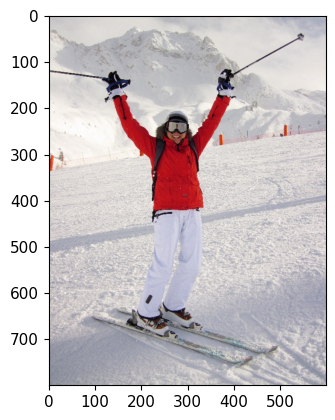

In [ ]:
# load image
image = cv2.imread("images/active-cold-female-girl-41371.jpeg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
%matplotlib inline 

plt.imshow(image)
plt.show()

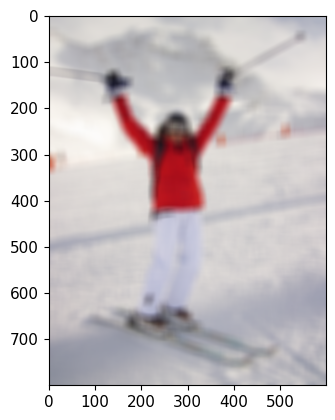

In [ ]:
# blur all image
blurred = cv2.blur(image, (21, 21)) # 21 - kernel size

plt.imshow(blurred)
plt.show()

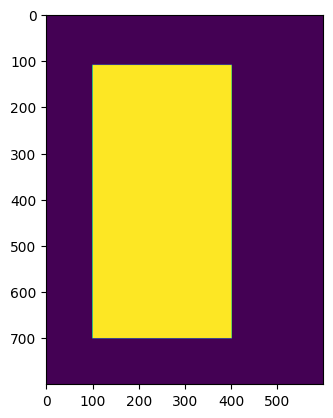

In [ ]:
# create the mask with the same size as image
mask = np.zeros(image.shape[:2], dtype="uint8")
cv2.rectangle(mask, (100, 110), (400, 700), 255, -1)

plt.imshow(mask)
plt.show()

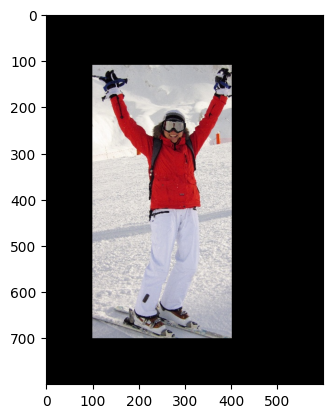

In [ ]:
# create masked image where pixels not presented in the mask should be black
masked = cv2.bitwise_and(image, image, mask=mask)

plt.imshow(masked)
plt.show()

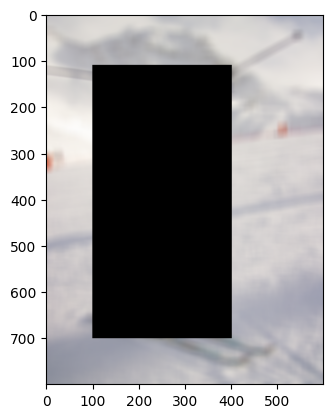

In [ ]:
# black out pixels on blurred image where the mask should be applied
mask_inv = cv2.bitwise_not(mask)
image_bg = cv2.bitwise_and(blurred, blurred, mask = mask_inv)

plt.imshow(image_bg)
plt.show()

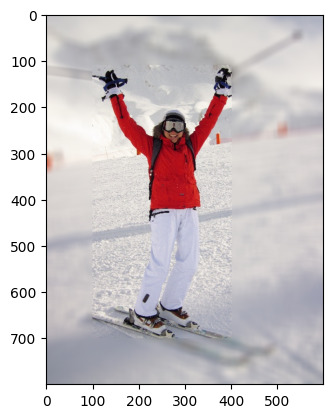

In [ ]:
# combine two images
final_image = cv2.add(image_bg, masked)

plt.imshow(final_image)
plt.show()

In [ ]:
# Load model and process

In [ ]:
import os
import platform
import sys
from pathlib import Path

import torch
import torch.backends.cudnn as cudnn
import numpy as np

In [ ]:
from models.common import DetectMultiBackend
from utils.dataloaders import IMG_FORMATS, VID_FORMATS, LoadImages, LoadStreams
from utils.general import (LOGGER, Profile, check_file, check_img_size, check_imshow, check_requirements, colorstr, cv2,
                           increment_path, non_max_suppression, print_args, scale_coords, strip_optimizer, xyxy2xywh)
from utils.plots import Annotator, colors, save_one_box
from utils.segment.general import process_mask, scale_masks
from utils.segment.plots import plot_masks
from utils.torch_utils import select_device, smart_inference_mode

In [ ]:
weights='data/ruslan_200k.pt'  # model.pt path(s)
source='images/active-cold-female-girl-41371.jpeg'  # file/dir/URL/glob, 0 for webcam
data='data/body.yaml'  # dataset.yaml path
imgsz=(640, 640)  # inference size (height, width)
conf_thres=0.25  # confidence threshold
iou_thres=0.45  # NMS IOU threshold
max_det=1000  # maximum detections per image
device=''  # cuda device, i.e. 0 or 0,1,2,3 or cpu
view_img=False  # show results
save_txt=False  # save results to *.txt
save_conf=False  # save confidences in --save-txt labels
save_crop=False  # save cropped prediction boxes
nosave=False  # do not save images/videos
classes=None  # filter by class: --class 0, or --class 0 2 3
agnostic_nms=False  # class-agnostic NMS
augment=False  # augmented inference
visualize=False  # visualize features
update=False  # update all models
project='runs/predict-seg'  # save results to project/name
name='exp'  # save results to project/name
exist_ok=False  # existing project/name ok, do not increment
line_thickness=3  # bounding box thickness (pixels)
hide_labels=False  # hide labels
hide_conf=False  # hide confidences
half=False  # use FP16 half-precision inference
dnn=False  # use OpenCV DNN for ONNX inference
trk = False


In [ ]:
# Load model
device = select_device(device)
model = DetectMultiBackend(weights, device=device, dnn=dnn, data=data, fp16=half)
stride, names, pt = model.stride, model.names, model.pt
imgsz = check_img_size(imgsz, s=stride)  # check image size


YOLOv5 🚀 yolov7-segmentation-13-gefb9148 Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
yolov7-seg summary: 325 layers, 37842476 parameters, 0 gradients, 141.9 GFLOPs


In [ ]:
def letterbox(im, new_shape=(640, 640), color=(114, 114, 114), auto=True, scaleFill=False, scaleup=True, stride=32):
    # Resize and pad image while meeting stride-multiple constraints
    shape = im.shape[:2]  # current shape [height, width]
    if isinstance(new_shape, int):
        new_shape = (new_shape, new_shape)

    # Scale ratio (new / old)
    r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])
    if not scaleup:  # only scale down, do not scale up (for better val mAP)
        r = min(r, 1.0)

    # Compute padding
    ratio = r, r  # width, height ratios
    new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
    dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
    if auto:  # minimum rectangle
        dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
    elif scaleFill:  # stretch
        dw, dh = 0.0, 0.0
        new_unpad = (new_shape[1], new_shape[0])
        ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios

    dw /= 2  # divide padding into 2 sides
    dh /= 2

    if shape[::-1] != new_unpad:  # resize
        im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)
    top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
    left, right = int(round(dw - 0.1)), int(round(dw + 0.1))
    im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border
    return im, ratio, (dw, dh)


In [ ]:
img_size = [640, 640]
stride = 32
auto = True
im = letterbox(image, img_size, stride=stride, auto=auto)[0]  # padded resize
im = im.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
im = np.ascontiguousarray(im)  # contiguous


In [ ]:
im = torch.from_numpy(im).to(device)
im = im.half() if model.fp16 else im.float()  # uint8 to fp16/32
im /= 255  # 0 - 255 to 0.0 - 1.0
if len(im.shape) == 3:
    im = im[None]  # expand for batch dim
im.shape

torch.Size([1, 3, 640, 480])

In [ ]:
# inference
pred, out = model(im, augment=augment, visualize=False)
proto = out[1]

In [ ]:
# NMS
pred = non_max_suppression(pred, conf_thres, iou_thres, classes, agnostic_nms, max_det=max_det, nm=32)


In [ ]:
len(pred)

1

In [ ]:
det = pred[0]


In [ ]:
protos = proto[0]
masks_in = det[:, 6:]
bboxes = det[:, :4]
shape = im.shape[2:]
upsample = True

In [ ]:
def crop(masks, boxes):
    """
    "Crop" predicted masks by zeroing out everything not in the predicted bbox.
    Vectorized by Chong (thanks Chong).

    Args:
        - masks should be a size [h, w, n] tensor of masks
        - boxes should be a size [n, 4] tensor of bbox coords in relative point form
    """

    n, h, w = masks.shape
    x1, y1, x2, y2 = torch.chunk(boxes[:, :, None], 4, 1)  # x1 shape(1,1,n)
    r = torch.arange(w, device=masks.device, dtype=x1.dtype)[None, None, :]  # rows shape(1,w,1)
    c = torch.arange(h, device=masks.device, dtype=x1.dtype)[None, :, None]  # cols shape(h,1,1)

    return masks * ((r >= x1) * (r < x2) * (c >= y1) * (c < y2))


In [ ]:
import torch.nn.functional as F

c, mh, mw = protos.shape  # CHW
ih, iw = shape
masks = (masks_in @ protos.float().view(c, -1)).sigmoid().view(-1, mh, mw)  # CHW

downsampled_bboxes = bboxes.clone()
downsampled_bboxes[:, 0] *= mw / iw
downsampled_bboxes[:, 2] *= mw / iw
downsampled_bboxes[:, 3] *= mh / ih
downsampled_bboxes[:, 1] *= mh / ih

masks = crop(masks, downsampled_bboxes)  # CHW
if upsample:
    masks = F.interpolate(masks[None], shape, mode='bilinear', align_corners=False)[0]  # CHW
masks = masks.gt_(0.5)
masks = masks[:, :, :, None]


In [ ]:
masks_numpy = (masks * 255).byte().cpu().numpy()
masks_numpy.shape

(1, 640, 480, 1)

In [ ]:
img_shape = image.shape
resized_mask = cv2.resize(masks_numpy[0], (img_shape[1], img_shape[0]))

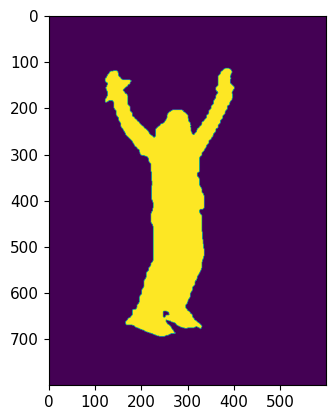

In [ ]:
plt.imshow(resized_mask)
plt.show()

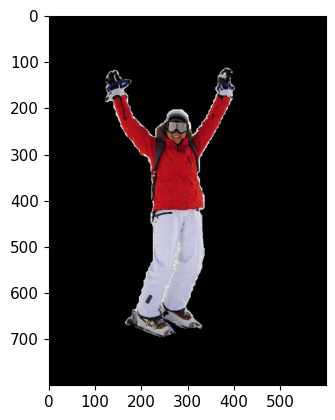

In [ ]:
# TODO маючи маску розмийте фон зображення використовуючи приклади коду вище

# create masked image where pixels not presented in the mask should be black
masked2 = cv2.bitwise_and(image, image, mask=resized_mask)

plt.imshow(masked2)
plt.show()

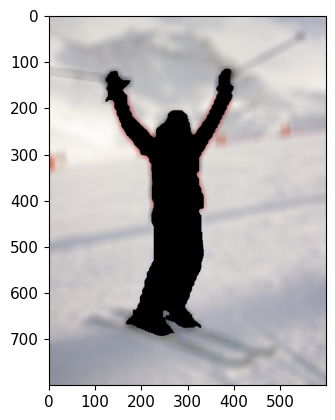

In [ ]:
# black out pixels on blurred image where the mask should be applied
mask_inv2 = cv2.bitwise_not(resized_mask)
image_bg2 = cv2.bitwise_and(blurred, blurred, mask = mask_inv2)

plt.imshow(image_bg2)
plt.show()

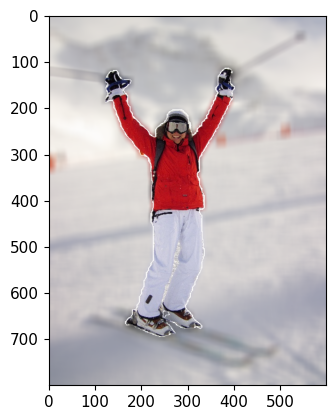

In [ ]:
# combine two images
final_image2 = cv2.add(image_bg2, masked2)

plt.imshow(final_image2)
plt.show()